In [1]:
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader
import torchvision.transforms as transforms
from torchvision.utils import make_grid

import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from PIL import Image
import cv2
import albumentations as A
from albumentations.pytorch import ToTensorV2
from tqdm import tqdm
import os
import glob
from sklearn.metrics import confusion_matrix, f1_score, accuracy_score
import warnings
warnings.filterwarnings('ignore')

# Set device
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(f"🚀 Using device: {device}")

# Print version info
print(f"PyTorch version: {torch.__version__}")
print(f"NumPy version: {np.__version__}")
print(f"OpenCV version: {cv2.__version__}")
print(f"Albumentations version: {A.__version__}")

# Set random seeds for reproducibility
torch.manual_seed(42)
np.random.seed(42)
if torch.cuda.is_available():
    torch.cuda.manual_seed(42)

print("✅ Libraries imported successfully!")

🚀 Using device: cuda
PyTorch version: 2.6.0+cu124
NumPy version: 1.26.4
OpenCV version: 4.12.0
Albumentations version: 2.0.8
✅ Libraries imported successfully!


📊 TRAIN Dataset loaded: 445 samples
📊 VAL Dataset loaded: 64 samples
📊 TEST Dataset loaded: 128 samples

📈 Dataset Summary:
   Training samples:   445
   Validation samples: 64
   Test samples:       128
   Total:              637


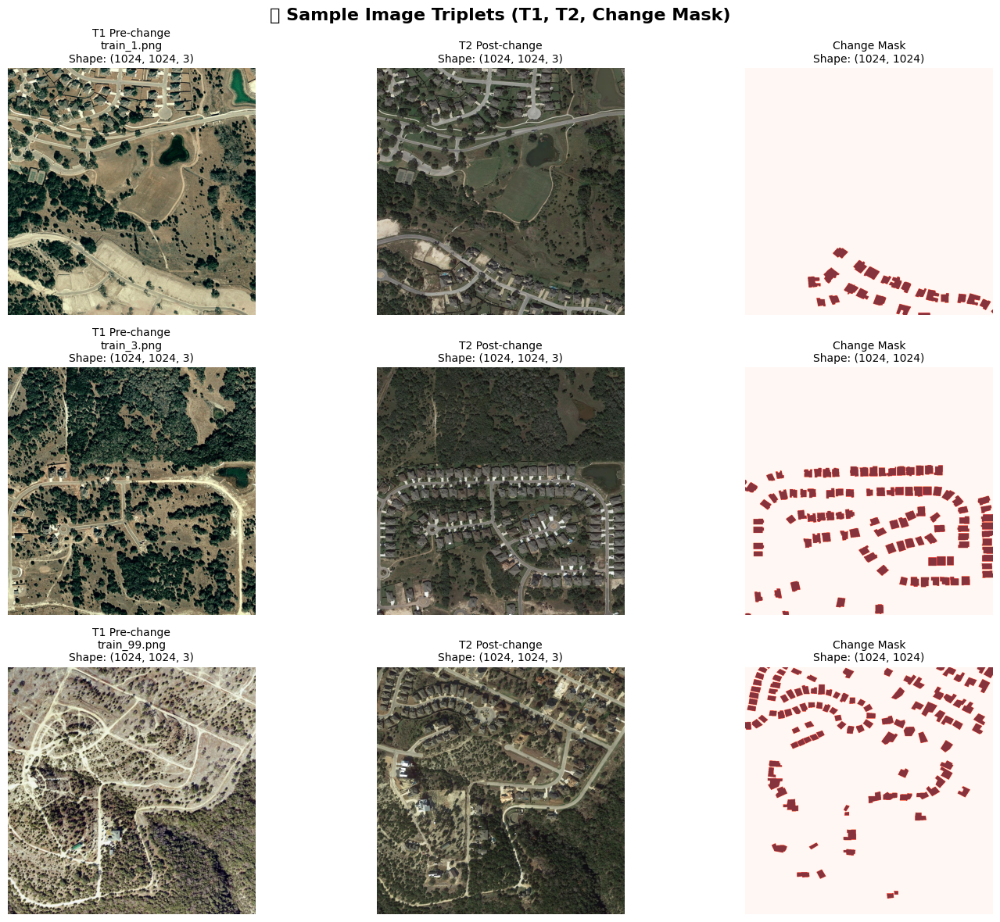

✅ Dataset loaded and visualized successfully!


In [2]:
class ChangeDetectionDataset(Dataset):
    def __init__(self, root_dir, split='train', transform=None):
        self.root_dir = root_dir
        self.split = split
        self.transform = transform

        # Define folders for T1, T2, and labels
        self.img_A_dir = os.path.join(root_dir, split, 'A')
        self.img_B_dir = os.path.join(root_dir, split, 'B')
        self.label_dir = os.path.join(root_dir, split, 'label')

        # Collect all .png image paths
        self.img_A_paths = sorted(glob.glob(os.path.join(self.img_A_dir, '*.png')))
        self.img_B_paths = sorted(glob.glob(os.path.join(self.img_B_dir, '*.png')))
        self.label_paths = sorted(glob.glob(os.path.join(self.label_dir, '*.png')))

        assert len(self.img_A_paths) == len(self.img_B_paths) == len(self.label_paths), \
            f"Inconsistent dataset: {len(self.img_A_paths)} A, {len(self.img_B_paths)} B, {len(self.label_paths)} labels"

        print(f"📊 {split.upper()} Dataset loaded: {len(self.img_A_paths)} samples")

    def __len__(self):
        return len(self.img_A_paths)

    def __getitem__(self, idx):
        img_A = Image.open(self.img_A_paths[idx]).convert('RGB')
        img_B = Image.open(self.img_B_paths[idx]).convert('RGB')
        label = Image.open(self.label_paths[idx]).convert('L')  # grayscale mask

        # Convert to NumPy
        img_A = np.array(img_A)
        img_B = np.array(img_B)
        label = np.array(label)

        label = (label > 127).astype(np.float32)

        if self.transform:
            transformed = self.transform(image=img_A, image0=img_B, mask=label)
            img_A = transformed['image']
            img_B = transformed['image0']
            label = transformed['mask']

        return img_A, img_B, label, os.path.basename(self.img_A_paths[idx])


# Step 2: Define Your Dataset Path Below (📂 UPDATE THIS LINE)
dataset_root = '/kaggle/input/levir-cd/LEVIR CD'  # <- 🔧 PUT YOUR LOCAL PATH HERE

# Step 3: Create Dataset Objects
train_dataset = ChangeDetectionDataset(dataset_root, split='train')
val_dataset = ChangeDetectionDataset(dataset_root, split='val')
test_dataset = ChangeDetectionDataset(dataset_root, split='test')

print(f"\n📈 Dataset Summary:")
print(f"   Training samples:   {len(train_dataset)}")
print(f"   Validation samples: {len(val_dataset)}")
print(f"   Test samples:       {len(test_dataset)}")
print(f"   Total:              {len(train_dataset) + len(val_dataset) + len(test_dataset)}")

# Step 4: Visualize Sample Image Triplets
fig, axes = plt.subplots(3, 3, figsize=(15, 12))
fig.suptitle('🖼️ Sample Image Triplets (T1, T2, Change Mask)', fontsize=16, fontweight='bold')

num_samples = 3
sample_indices = [min(i, len(train_dataset) - 1) for i in np.linspace(0, len(train_dataset) - 1, num_samples, dtype=int)]

for i, idx in enumerate(sample_indices):
    img_A, img_B, label, filename = train_dataset[idx]

    # Ensure shape is compatible for matplotlib
    if isinstance(img_A, torch.Tensor):
        img_A = img_A.numpy().transpose(1, 2, 0)
        img_B = img_B.numpy().transpose(1, 2, 0)
        label = label.numpy()

    axes[i, 0].imshow(img_A)
    axes[i, 0].set_title(f'T1 Pre-change\n{filename}\nShape: {img_A.shape}', fontsize=10)
    axes[i, 0].axis('off')

    axes[i, 1].imshow(img_B)
    axes[i, 1].set_title(f'T2 Post-change\nShape: {img_B.shape}', fontsize=10)
    axes[i, 1].axis('off')

    axes[i, 2].imshow(label, cmap='Reds', alpha=0.8)
    axes[i, 2].set_title(f'Change Mask\nShape: {label.shape}', fontsize=10)
    axes[i, 2].axis('off')

plt.tight_layout()
plt.show()

print("✅ Dataset loaded and visualized successfully!")

In [3]:
import os

for split in ['train', 'val', 'test']:
    print(f"\nChecking {split.upper()}:")
    for sub in ['A', 'B', 'labels']:
        path = os.path.join(dataset_root, split, sub)
        print(f"{path} → Exists? {os.path.exists(path)} | Files: {len(os.listdir(path)) if os.path.exists(path) else 'N/A'}")



Checking TRAIN:
/kaggle/input/levir-cd/LEVIR CD/train/A → Exists? True | Files: 445
/kaggle/input/levir-cd/LEVIR CD/train/B → Exists? True | Files: 445
/kaggle/input/levir-cd/LEVIR CD/train/labels → Exists? False | Files: N/A

Checking VAL:
/kaggle/input/levir-cd/LEVIR CD/val/A → Exists? True | Files: 64
/kaggle/input/levir-cd/LEVIR CD/val/B → Exists? True | Files: 64
/kaggle/input/levir-cd/LEVIR CD/val/labels → Exists? False | Files: N/A

Checking TEST:
/kaggle/input/levir-cd/LEVIR CD/test/A → Exists? True | Files: 128
/kaggle/input/levir-cd/LEVIR CD/test/B → Exists? True | Files: 128
/kaggle/input/levir-cd/LEVIR CD/test/labels → Exists? False | Files: N/A


In [4]:
import glob

# Try other common label directory names
alt_label_dirs = ['labels', 'label', 'gt', 'masks', 'annotation']
for name in alt_label_dirs:
    label_dir = os.path.join(dataset_root, 'train', name)
    label_files = glob.glob(os.path.join(label_dir, '*'))
    print(f"{label_dir} → Found {len(label_files)} files")


/kaggle/input/levir-cd/LEVIR CD/train/labels → Found 0 files
/kaggle/input/levir-cd/LEVIR CD/train/label → Found 445 files
/kaggle/input/levir-cd/LEVIR CD/train/gt → Found 0 files
/kaggle/input/levir-cd/LEVIR CD/train/masks → Found 0 files
/kaggle/input/levir-cd/LEVIR CD/train/annotation → Found 0 files


📊 TRAIN Dataset loaded: 445 samples
📊 VAL Dataset loaded: 64 samples
📊 TEST Dataset loaded: 128 samples
📊 TRAIN Dataset loaded: 445 samples


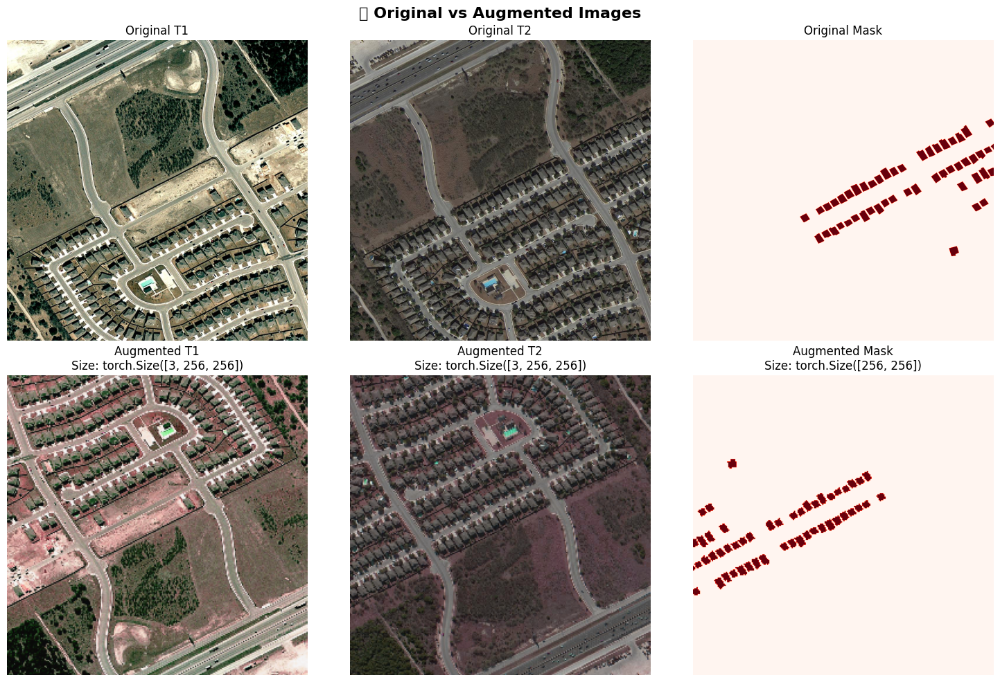

✅ Preprocessing and augmentation setup complete!


In [5]:
train_transform = A.Compose([
    A.Resize(256, 256),
    A.HorizontalFlip(p=0.5),
    A.VerticalFlip(p=0.5),
    A.RandomRotate90(p=0.5),
    A.ColorJitter(brightness=0.2, contrast=0.2, saturation=0.2, hue=0.1, p=0.5),
    A.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
    ToTensorV2()
], additional_targets={'image0': 'image'})

val_transform = A.Compose([
    A.Resize(256, 256),
    A.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
    ToTensorV2()
], additional_targets={'image0': 'image'})

# Create datasets with transforms
train_dataset_aug = ChangeDetectionDataset(dataset_root, 'train', train_transform)
val_dataset_aug = ChangeDetectionDataset(dataset_root, 'val', val_transform)
test_dataset_aug = ChangeDetectionDataset(dataset_root, 'test', val_transform)

# Visualize augmentations
sample_idx = 42
original = ChangeDetectionDataset(dataset_root, 'train')[sample_idx]
augmented = train_dataset_aug[sample_idx]

fig, axes = plt.subplots(2, 3, figsize=(15, 10))
fig.suptitle('🧼 Original vs Augmented Images', fontsize=16, fontweight='bold')

# Original images
img_A_orig, img_B_orig, label_orig, filename = original
axes[0, 0].imshow(img_A_orig)
axes[0, 0].set_title('Original T1', fontsize=12)
axes[0, 0].axis('off')

axes[0, 1].imshow(img_B_orig)
axes[0, 1].set_title('Original T2', fontsize=12)
axes[0, 1].axis('off')

axes[0, 2].imshow(label_orig, cmap='Reds')
axes[0, 2].set_title('Original Mask', fontsize=12)
axes[0, 2].axis('off')

# Augmented images (denormalize for visualization)
img_A_aug, img_B_aug, label_aug, _ = augmented

# Denormalize
mean = torch.tensor([0.485, 0.456, 0.406]).view(3, 1, 1)
std = torch.tensor([0.229, 0.224, 0.225]).view(3, 1, 1)
img_A_denorm = (img_A_aug * std + mean).clamp(0, 1).permute(1, 2, 0)
img_B_denorm = (img_B_aug * std + mean).clamp(0, 1).permute(1, 2, 0)

axes[1, 0].imshow(img_A_denorm)
axes[1, 0].set_title(f'Augmented T1\nSize: {img_A_aug.shape}', fontsize=12)
axes[1, 0].axis('off')

axes[1, 1].imshow(img_B_denorm)
axes[1, 1].set_title(f'Augmented T2\nSize: {img_B_aug.shape}', fontsize=12)
axes[1, 1].axis('off')

axes[1, 2].imshow(label_aug.squeeze(), cmap='Reds')
axes[1, 2].set_title(f'Augmented Mask\nSize: {label_aug.shape}', fontsize=12)
axes[1, 2].axis('off')

plt.tight_layout()
plt.show()

print("✅ Preprocessing and augmentation setup complete!")

🧠 Model initialized with 7,686,977 parameters
📊 Training batches: 56, Validation batches: 8
🚀 Starting training...


Epoch 1/10: 100%|██████████| 56/56 [00:41<00:00,  1.35it/s, Loss=0.5469]


Epoch 1: Train Loss: 0.6332, Train IoU: 0.0057
           Val Loss: 0.5448, Val IoU: 0.0000


Epoch 2/10: 100%|██████████| 56/56 [00:41<00:00,  1.34it/s, Loss=0.4467]


Epoch 2: Train Loss: 0.5054, Train IoU: 0.0000
           Val Loss: 0.4575, Val IoU: 0.0000


Epoch 3/10: 100%|██████████| 56/56 [00:44<00:00,  1.26it/s, Loss=0.4398]


Epoch 3: Train Loss: 0.4581, Train IoU: 0.0927
           Val Loss: 0.4407, Val IoU: 0.1910
💾 New best model saved! IoU: 0.1910


Epoch 4/10: 100%|██████████| 56/56 [00:47<00:00,  1.19it/s, Loss=0.4340]


Epoch 4: Train Loss: 0.4385, Train IoU: 0.2095
           Val Loss: 0.4211, Val IoU: 0.2255
💾 New best model saved! IoU: 0.2255


Epoch 5/10: 100%|██████████| 56/56 [00:46<00:00,  1.20it/s, Loss=0.3788]


Epoch 5: Train Loss: 0.4284, Train IoU: 0.2234
           Val Loss: 0.4139, Val IoU: 0.2285
💾 New best model saved! IoU: 0.2285


Epoch 6/10: 100%|██████████| 56/56 [00:46<00:00,  1.20it/s, Loss=0.4220]


Epoch 6: Train Loss: 0.4109, Train IoU: 0.2442
           Val Loss: 0.3666, Val IoU: 0.2919
💾 New best model saved! IoU: 0.2919


Epoch 7/10: 100%|██████████| 56/56 [00:46<00:00,  1.20it/s, Loss=0.3775]


Epoch 7: Train Loss: 0.3957, Train IoU: 0.2605
           Val Loss: 0.3818, Val IoU: 0.2838


Epoch 8/10: 100%|██████████| 56/56 [00:46<00:00,  1.20it/s, Loss=0.3501]


Epoch 8: Train Loss: 0.3583, Train IoU: 0.3125
           Val Loss: 0.3058, Val IoU: 0.3860
💾 New best model saved! IoU: 0.3860


Epoch 9/10: 100%|██████████| 56/56 [00:46<00:00,  1.20it/s, Loss=0.3764]


Epoch 9: Train Loss: 0.3063, Train IoU: 0.3857
           Val Loss: 0.2930, Val IoU: 0.4059
💾 New best model saved! IoU: 0.4059


Epoch 10/10: 100%|██████████| 56/56 [00:46<00:00,  1.20it/s, Loss=0.3009]


Epoch 10: Train Loss: 0.2962, Train IoU: 0.4018
           Val Loss: 0.2696, Val IoU: 0.4354
💾 New best model saved! IoU: 0.4354


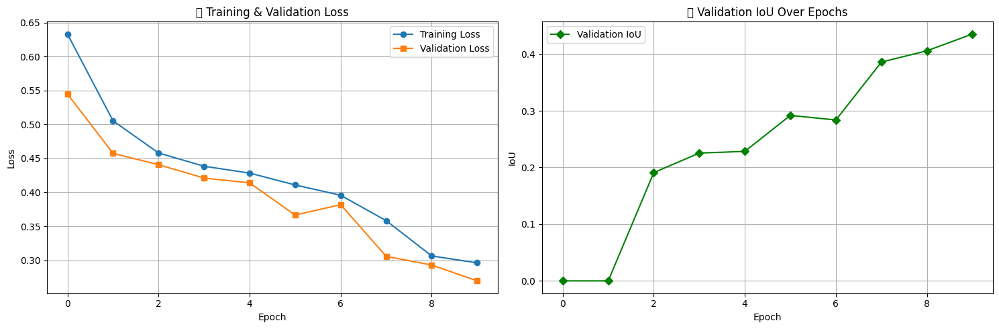

✅ Training completed successfully!


In [6]:
class MultiHeadAttention(nn.Module):
    def __init__(self, d_model, num_heads):
        super().__init__()
        self.d_model = d_model
        self.num_heads = num_heads
        self.d_k = d_model // num_heads
        
        self.W_q = nn.Linear(d_model, d_model)
        self.W_k = nn.Linear(d_model, d_model)
        self.W_v = nn.Linear(d_model, d_model)
        self.W_o = nn.Linear(d_model, d_model)
        
    def forward(self, query, key, value):
        batch_size = query.size(0)
        
        Q = self.W_q(query).view(batch_size, -1, self.num_heads, self.d_k).transpose(1, 2)
        K = self.W_k(key).view(batch_size, -1, self.num_heads, self.d_k).transpose(1, 2)
        V = self.W_v(value).view(batch_size, -1, self.num_heads, self.d_k).transpose(1, 2)
        
        scores = torch.matmul(Q, K.transpose(-2, -1)) / (self.d_k ** 0.5)
        attention = torch.softmax(scores, dim=-1)
        
        context = torch.matmul(attention, V)
        context = context.transpose(1, 2).contiguous().view(batch_size, -1, self.d_model)
        
        return self.W_o(context)

class TransformerBlock(nn.Module):
    def __init__(self, d_model, num_heads, d_ff):
        super().__init__()
        self.attention = MultiHeadAttention(d_model, num_heads)
        self.norm1 = nn.LayerNorm(d_model)
        self.norm2 = nn.LayerNorm(d_model)
        
        self.ff = nn.Sequential(
            nn.Linear(d_model, d_ff),
            nn.ReLU(),
            nn.Linear(d_ff, d_model)
        )
        
    def forward(self, x):
        attn_out = self.attention(x, x, x)
        x = self.norm1(x + attn_out)
        ff_out = self.ff(x)
        x = self.norm2(x + ff_out)
        return x

class ChangeFormerPlusPlus(nn.Module):
    def __init__(self, in_channels=3, num_classes=1, d_model=256, num_heads=8, num_layers=6):
        super().__init__()
        
        # Siamese CNN encoder for feature extraction
        self.encoder = nn.Sequential(
            nn.Conv2d(in_channels, 64, 3, padding=1),
            nn.ReLU(inplace=True),
            nn.Conv2d(64, 64, 3, padding=1),
            nn.ReLU(inplace=True),
            nn.MaxPool2d(2),
            
            nn.Conv2d(64, 128, 3, padding=1),
            nn.ReLU(inplace=True),
            nn.Conv2d(128, 128, 3, padding=1),
            nn.ReLU(inplace=True),
            nn.MaxPool2d(2),
            
            nn.Conv2d(128, 256, 3, padding=1),
            nn.ReLU(inplace=True),
            nn.Conv2d(256, 256, 3, padding=1),
            nn.ReLU(inplace=True),
            nn.MaxPool2d(2),
            
            nn.Conv2d(256, d_model, 3, padding=1),
            nn.ReLU(inplace=True)
        )
        
        # Transformer blocks for spatio-temporal reasoning
        self.transformer_blocks = nn.ModuleList([
            TransformerBlock(d_model, num_heads, d_model*4) for _ in range(num_layers)
        ])
        
        # Generative decoder
        self.decoder = nn.Sequential(
            nn.ConvTranspose2d(d_model*2, 128, 4, stride=2, padding=1),
            nn.ReLU(inplace=True),
            nn.ConvTranspose2d(128, 64, 4, stride=2, padding=1),
            nn.ReLU(inplace=True),
            nn.ConvTranspose2d(64, 32, 4, stride=2, padding=1),
            nn.ReLU(inplace=True),
            nn.Conv2d(32, num_classes, 3, padding=1),
            nn.Sigmoid()
        )
        
    def forward(self, x1, x2):
        # Extract features from both time points
        f1 = self.encoder(x1)  # [B, d_model, H/8, W/8]
        f2 = self.encoder(x2)
        
        # Flatten for transformer
        B, C, H, W = f1.shape
        f1_flat = f1.view(B, C, H*W).transpose(1, 2)  # [B, H*W, d_model]
        f2_flat = f2.view(B, C, H*W).transpose(1, 2)
        
        # Apply transformer blocks
        for transformer in self.transformer_blocks:
            f1_flat = transformer(f1_flat)
            f2_flat = transformer(f2_flat)
        
        # Reshape back
        f1_trans = f1_flat.transpose(1, 2).view(B, C, H, W)
        f2_trans = f2_flat.transpose(1, 2).view(B, C, H, W)
        
        # Concatenate difference features
        diff_features = torch.cat([f1_trans, f2_trans], dim=1)
        
        # Generate change map
        output = self.decoder(diff_features)
        
        return output

# Loss functions
class DiceLoss(nn.Module):
    def __init__(self, smooth=1e-6):
        super().__init__()
        self.smooth = smooth
        
    def forward(self, pred, target):
        pred = pred.view(-1)
        target = target.view(-1)
        
        intersection = (pred * target).sum()
        dice = (2. * intersection + self.smooth) / (pred.sum() + target.sum() + self.smooth)
        
        return 1 - dice

class CombinedLoss(nn.Module):
    def __init__(self, dice_weight=0.5, bce_weight=0.5):
        super().__init__()
        self.dice_loss = DiceLoss()
        self.bce_loss = nn.BCELoss()
        self.dice_weight = dice_weight
        self.bce_weight = bce_weight
        
    def forward(self, pred, target):
        dice = self.dice_loss(pred, target)
        bce = self.bce_loss(pred, target)
        return self.dice_weight * dice + self.bce_weight * bce

def calculate_iou(pred, target, threshold=0.5):
    pred_bin = (pred > threshold).float()
    intersection = (pred_bin * target).sum()
    union = pred_bin.sum() + target.sum() - intersection
    iou = intersection / (union + 1e-6)
    return iou.item()

# Initialize model, loss, and optimizer
model = ChangeFormerPlusPlus().to(device)
criterion = CombinedLoss()
optimizer = optim.Adam(model.parameters(), lr=1e-4, weight_decay=1e-5)
scheduler = optim.lr_scheduler.ReduceLROnPlateau(optimizer, mode='max', patience=3, factor=0.5)

# Data loaders
train_loader = DataLoader(train_dataset_aug, batch_size=8, shuffle=True, num_workers=2)
val_loader = DataLoader(val_dataset_aug, batch_size=8, shuffle=False, num_workers=2)

print(f"🧠 Model initialized with {sum(p.numel() for p in model.parameters()):,} parameters")
print(f"📊 Training batches: {len(train_loader)}, Validation batches: {len(val_loader)}")

# Training loop
num_epochs = 10
train_losses = []
val_losses = []
val_ious = []
best_iou = 0.0

print("🚀 Starting training...")

for epoch in range(num_epochs):
    # Training phase
    model.train()
    train_loss = 0.0
    train_iou = 0.0
    
    pbar = tqdm(train_loader, desc=f'Epoch {epoch+1}/{num_epochs}')
    for img_A, img_B, labels, _ in pbar:
        img_A, img_B, labels = img_A.to(device), img_B.to(device), labels.to(device)
        
        optimizer.zero_grad()
        outputs = model(img_A, img_B)
        loss = criterion(outputs.squeeze(), labels.squeeze())
        loss.backward()
        optimizer.step()
        
        train_loss += loss.item()
        train_iou += calculate_iou(outputs.squeeze(), labels.squeeze())
        
        pbar.set_postfix({'Loss': f'{loss.item():.4f}'})
    
    # Validation phase
    model.eval()
    val_loss = 0.0
    val_iou = 0.0
    
    with torch.no_grad():
        for img_A, img_B, labels, _ in val_loader:
            img_A, img_B, labels = img_A.to(device), img_B.to(device), labels.to(device)
            
            outputs = model(img_A, img_B)
            loss = criterion(outputs.squeeze(), labels.squeeze())
            
            val_loss += loss.item()
            val_iou += calculate_iou(outputs.squeeze(), labels.squeeze())
    
    # Calculate averages
    train_loss /= len(train_loader)
    train_iou /= len(train_loader)
    val_loss /= len(val_loader)
    val_iou /= len(val_loader)
    
    train_losses.append(train_loss)
    val_losses.append(val_loss)
    val_ious.append(val_iou)
    
    print(f"Epoch {epoch+1}: Train Loss: {train_loss:.4f}, Train IoU: {train_iou:.4f}")
    print(f"           Val Loss: {val_loss:.4f}, Val IoU: {val_iou:.4f}")
    
    # Save best model
    if val_iou > best_iou:
        best_iou = val_iou
        torch.save(model.state_dict(), 'best_changeformer_model.pth')
        print(f"💾 New best model saved! IoU: {best_iou:.4f}")
    
    scheduler.step(val_iou)

# Plot training curves
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 5))

ax1.plot(train_losses, label='Training Loss', marker='o')
ax1.plot(val_losses, label='Validation Loss', marker='s')
ax1.set_title('📉 Training & Validation Loss')
ax1.set_xlabel('Epoch')
ax1.set_ylabel('Loss')
ax1.legend()
ax1.grid(True)

ax2.plot(val_ious, label='Validation IoU', marker='D', color='green')
ax2.set_title('📈 Validation IoU Over Epochs')
ax2.set_xlabel('Epoch')
ax2.set_ylabel('IoU')
ax2.legend()
ax2.grid(True)

plt.tight_layout()
plt.show()

print("✅ Training completed successfully!")


🏆 Best model loaded!
📊 Model Selection Summary:
   Best Epoch: 10
   Best Validation IoU: 0.4354
   Final Training Loss: 0.2962
   Final Validation Loss: 0.2696


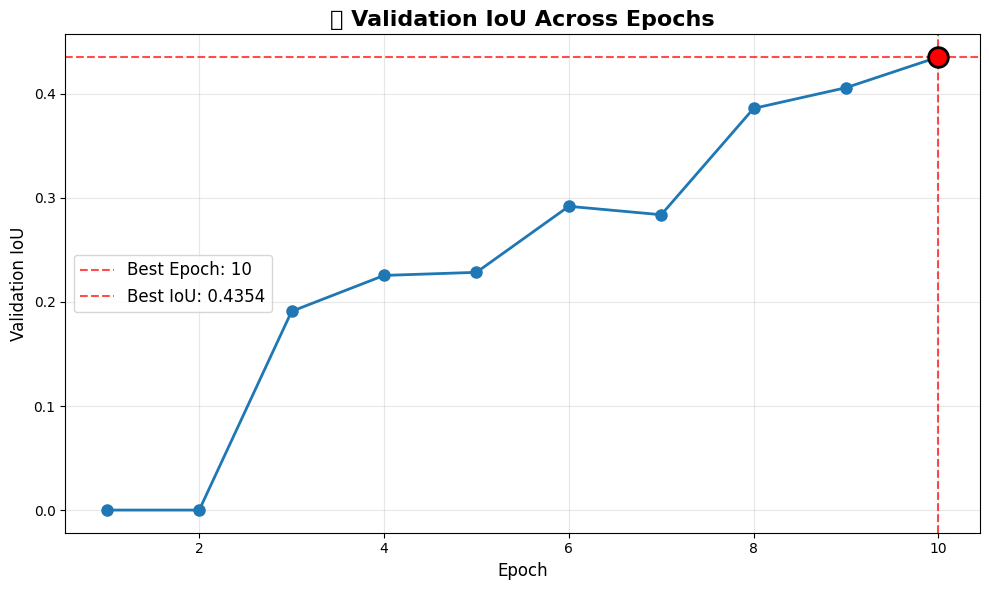

✅ Best model selected and checkpoint saved!


In [7]:
model.load_state_dict(torch.load('best_changeformer_model.pth'))
print(f"🏆 Best model loaded!")

# Find best epoch
best_epoch = val_ious.index(max(val_ious)) + 1
best_val_iou = max(val_ious)

print(f"📊 Model Selection Summary:")
print(f"   Best Epoch: {best_epoch}")
print(f"   Best Validation IoU: {best_val_iou:.4f}")
print(f"   Final Training Loss: {train_losses[-1]:.4f}")
print(f"   Final Validation Loss: {val_losses[-1]:.4f}")

# Plot validation IoU with best epoch highlighted
plt.figure(figsize=(10, 6))
plt.plot(range(1, len(val_ious)+1), val_ious, marker='o', linewidth=2, markersize=8)
plt.axvline(x=best_epoch, color='red', linestyle='--', alpha=0.7, label=f'Best Epoch: {best_epoch}')
plt.axhline(y=best_val_iou, color='red', linestyle='--', alpha=0.7, label=f'Best IoU: {best_val_iou:.4f}')
plt.scatter(best_epoch, best_val_iou, color='red', s=200, zorder=5, edgecolors='black', linewidth=2)

plt.title('🎯 Validation IoU Across Epochs', fontsize=16, fontweight='bold')
plt.xlabel('Epoch', fontsize=12)
plt.ylabel('Validation IoU', fontsize=12)
plt.legend(fontsize=12)
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()

print("✅ Best model selected and checkpoint saved!")

🔬 Running inference on test samples...


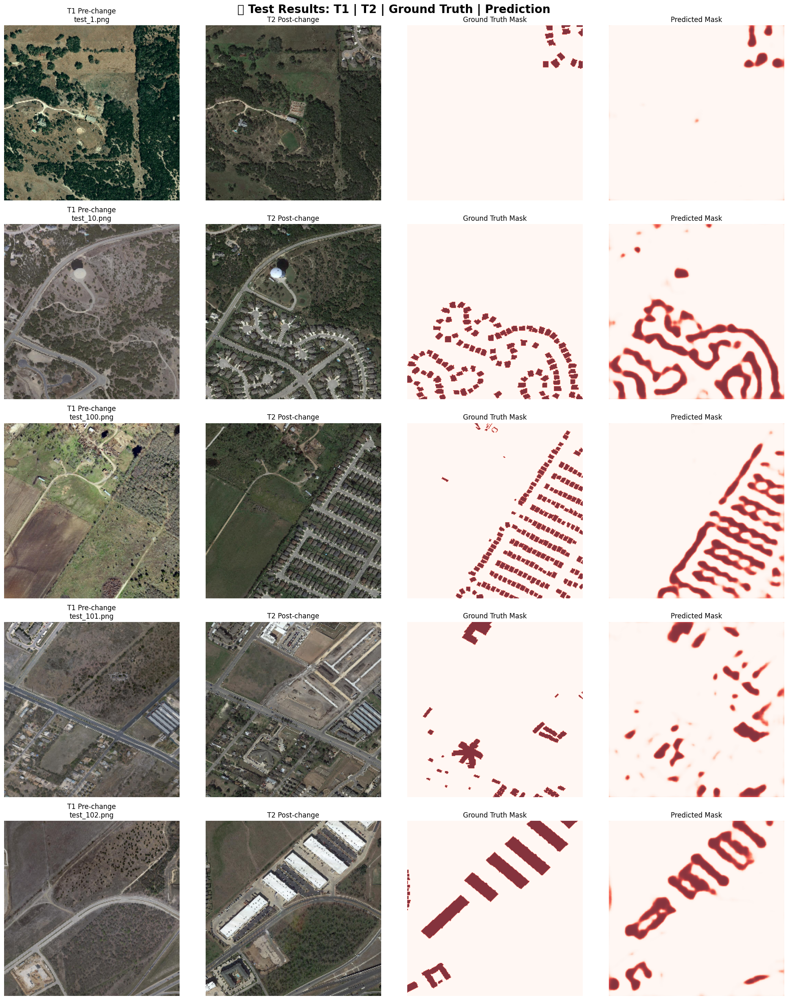

📊 Computing final test metrics...


Testing: 100%|██████████| 128/128 [00:25<00:00,  5.11it/s]


🎯 Final Test Metrics:
   F1 Score: 0.6102
   IoU (Intersection over Union): 0.4391
   Accuracy: 0.9594


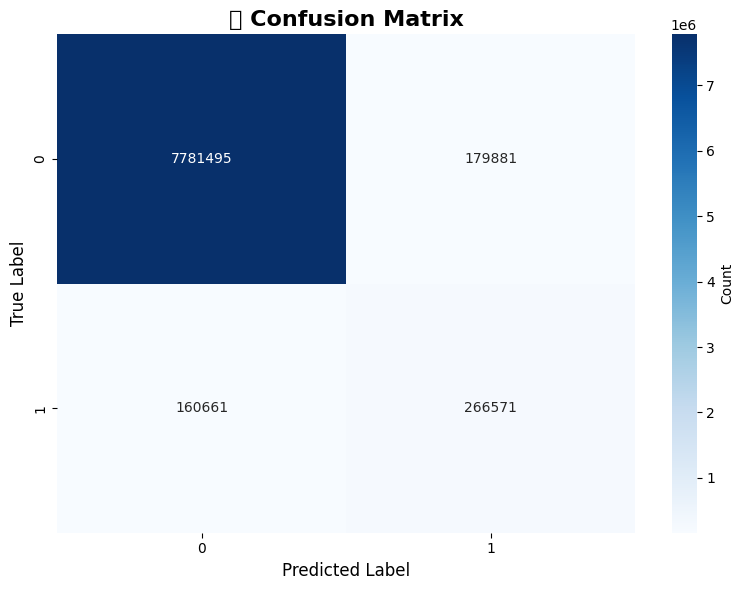

🎉 CHANGE DETECTION ANALYSIS COMPLETE!
✨ Model: ChangeFormer++ (GAN-free generative framework)
✨ Dataset: 637 bitemporal satellite images
✨ Best Validation IoU: 0.4354
✨ Test F1 Score: 0.6102
✨ Test IoU: 0.4391
✨ Test Accuracy: 0.9594


In [8]:
test_loader = DataLoader(test_dataset_aug, batch_size=1, shuffle=False)

# Run inference on 5 test samples
model.eval()
test_results = []

print("🔬 Running inference on test samples...")

with torch.no_grad():
    for i, (img_A, img_B, labels, filename) in enumerate(test_loader):
        if i >= 5:  # Only test on 5 samples
            break
            
        img_A, img_B, labels = img_A.to(device), img_B.to(device), labels.to(device)
        
        outputs = model(img_A, img_B)
        pred_mask = outputs.squeeze().cpu().numpy()
        
        # Denormalize images for visualization
        mean = np.array([0.485, 0.456, 0.406])
        std = np.array([0.229, 0.224, 0.225])
        
        img_A_denorm = img_A.squeeze().cpu().numpy().transpose(1, 2, 0)
        img_A_denorm = (img_A_denorm * std + mean).clip(0, 1)
        
        img_B_denorm = img_B.squeeze().cpu().numpy().transpose(1, 2, 0)
        img_B_denorm = (img_B_denorm * std + mean).clip(0, 1)
        
        gt_mask = labels.squeeze().cpu().numpy()
        
        test_results.append({
            'img_A': img_A_denorm,
            'img_B': img_B_denorm,
            'gt_mask': gt_mask,
            'pred_mask': pred_mask,
            'filename': filename[0]
        })

# Visualize test results
fig, axes = plt.subplots(5, 4, figsize=(20, 25))
fig.suptitle('🧪 Test Results: T1 | T2 | Ground Truth | Prediction', fontsize=20, fontweight='bold')

for i, result in enumerate(test_results):
    axes[i, 0].imshow(result['img_A'])
    axes[i, 0].set_title(f'T1 Pre-change\n{result["filename"]}', fontsize=12)
    axes[i, 0].axis('off')
    
    axes[i, 1].imshow(result['img_B'])
    axes[i, 1].set_title('T2 Post-change', fontsize=12)
    axes[i, 1].axis('off')
    
    axes[i, 2].imshow(result['gt_mask'], cmap='Reds', alpha=0.8)
    axes[i, 2].set_title('Ground Truth Mask', fontsize=12)
    axes[i, 2].axis('off')
    
    axes[i, 3].imshow(result['pred_mask'], cmap='Reds', alpha=0.8)
    axes[i, 3].set_title('Predicted Mask', fontsize=12)
    axes[i, 3].axis('off')

plt.tight_layout()
plt.show()

# Calculate comprehensive test metrics
print("📊 Computing final test metrics...")

all_predictions = []
all_targets = []

model.eval()
with torch.no_grad():
    for img_A, img_B, labels, _ in tqdm(test_loader, desc="Testing"):
        img_A, img_B, labels = img_A.to(device), img_B.to(device), labels.to(device)
        
        outputs = model(img_A, img_B)
        pred_mask = (outputs.squeeze() > 0.5).cpu().numpy().flatten()
        gt_mask = labels.squeeze().cpu().numpy().flatten()
        
        all_predictions.extend(pred_mask)
        all_targets.extend(gt_mask)

# Convert to numpy arrays
all_predictions = np.array(all_predictions)
all_targets = np.array(all_targets)

# Calculate metrics
f1 = f1_score(all_targets, all_predictions)
accuracy = accuracy_score(all_targets, all_predictions)

# Calculate IoU
intersection = np.logical_and(all_targets, all_predictions).sum()
union = np.logical_or(all_targets, all_predictions).sum()
iou = intersection / union if union > 0 else 0

print(f"🎯 Final Test Metrics:")
print(f"   F1 Score: {f1:.4f}")
print(f"   IoU (Intersection over Union): {iou:.4f}")
print(f"   Accuracy: {accuracy:.4f}")

# Create and display confusion matrix
cm = confusion_matrix(all_targets, all_predictions)

plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', cbar_kws={'label': 'Count'})
plt.title('🎭 Confusion Matrix', fontsize=16, fontweight='bold')
plt.xlabel('Predicted Label', fontsize=12)
plt.ylabel('True Label', fontsize=12)
plt.tight_layout()
plt.show()

print("=" * 80)
print("🎉 CHANGE DETECTION ANALYSIS COMPLETE!")
print("=" * 80)
print(f"✨ Model: ChangeFormer++ (GAN-free generative framework)")
print(f"✨ Dataset: {len(train_dataset) + len(val_dataset) + len(test_dataset)} bitemporal satellite images")
print(f"✨ Best Validation IoU: {best_val_iou:.4f}")
print(f"✨ Test F1 Score: {f1:.4f}")
print(f"✨ Test IoU: {iou:.4f}")
print(f"✨ Test Accuracy: {accuracy:.4f}")
print("=" * 80)

In [9]:
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader
from torch.optim.lr_scheduler import CosineAnnealingWarmRestarts, ReduceLROnPlateau
import albumentations as A
from albumentations.pytorch import ToTensorV2
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import f1_score, accuracy_score
from tqdm import tqdm
import os
import glob
from PIL import Image
import warnings
warnings.filterwarnings('ignore')

# Suppress Albumentations version check warning
os.environ['NO_ALBUMENTATIONS_UPDATE'] = '1'

In [10]:
# 1. ENHANCED DATASET FOR FINE-TUNING
# =========================================================================

class AdvancedChangeDetectionDataset(Dataset):
    def __init__(self, split_path, transform=None, use_mixup=False, mixup_alpha=0.2):
        self.split_path = split_path
        self.transform = transform
        self.use_mixup = use_mixup
        self.mixup_alpha = mixup_alpha
        self.split = os.path.basename(split_path)
        
        # Load image paths
        self.img_A_dir = os.path.join(split_path, 'A')
        self.img_B_dir = os.path.join(split_path, 'B') 
        self.label_dir = os.path.join(split_path, 'labels')
        
        self.img_A_paths = sorted(glob.glob(os.path.join(self.img_A_dir, '*.png')))
        self.img_B_paths = sorted(glob.glob(os.path.join(self.img_B_dir, '*.png')))
        self.label_paths = sorted(glob.glob(os.path.join(self.label_dir, '*.png')))
        
        print(f"📊 {self.split.upper()} Dataset: {len(self.img_A_paths)} samples")
        
    def __len__(self):
        return len(self.img_A_paths)
    
    def __getitem__(self, idx):
        # Load images
        img_A = Image.open(self.img_A_paths[idx]).convert('RGB')
        img_B = Image.open(self.img_B_paths[idx]).convert('RGB')
        label = Image.open(self.label_paths[idx]).convert('L')
        
        # Convert to numpy
        img_A = np.array(img_A)
        img_B = np.array(img_B)
        label = np.array(label)
        label = (label > 127).astype(np.float32)
        
        # Apply transforms
        if self.transform:
            transformed = self.transform(image=img_A, image0=img_B, mask=label)
            img_A = transformed['image']
            img_B = transformed['image0']
            label = transformed['mask']
        
        # Apply MixUp augmentation for training
        if self.use_mixup and self.split == 'train' and np.random.random() < 0.3:
            mix_idx = np.random.randint(0, len(self.img_A_paths))
            if mix_idx != idx:
                mix_img_A = Image.open(self.img_A_paths[mix_idx]).convert('RGB')
                mix_img_B = Image.open(self.img_B_paths[mix_idx]).convert('RGB')
                mix_label = Image.open(self.label_paths[mix_idx]).convert('L')
                
                mix_img_A = np.array(mix_img_A)
                mix_img_B = np.array(mix_img_B)
                mix_label = np.array(mix_label)
                mix_label = (mix_label > 127).astype(np.float32)
                
                if self.transform:
                    mix_transformed = self.transform(image=mix_img_A, image0=mix_img_B, mask=mix_label)
                    mix_img_A = mix_transformed['image']
                    mix_img_B = mix_transformed['image0']
                    mix_label = mix_transformed['mask']
                
                # MixUp
                lam = np.random.beta(self.mixup_alpha, self.mixup_alpha)
                img_A = lam * img_A + (1 - lam) * mix_img_A
                img_B = lam * img_B + (1 - lam) * mix_img_B
                label = lam * label + (1 - lam) * mix_label
        
        return img_A, img_B, label, os.path.basename(self.img_A_paths[idx])

In [11]:
# 2. FINE-TUNABLE CHANGEFORMER++ MODEL
# =========================================================================

class FinetuneableChangeFormerPlusPlus(nn.Module):
    def __init__(self, in_channels=3, num_classes=1, d_model=256, num_heads=8, num_layers=6, 
                 freeze_encoder=False, freeze_transformer=False):
        super().__init__()
        
        self.freeze_encoder = freeze_encoder
        self.freeze_transformer = freeze_transformer
        
        # Enhanced Siamese encoder
        self.encoder = self._build_encoder(in_channels, d_model)
        
        # Transformer blocks with position encoding
        self.pos_encoding = nn.Parameter(torch.randn(1, d_model, 32, 32) * 0.02)
        self.transformer_blocks = nn.ModuleList([
            self._build_transformer_block(d_model, num_heads) for _ in range(num_layers)
        ])
        
        # Enhanced decoder
        self.decoder = self._build_decoder(d_model, num_classes)
        
        # Apply selective freezing
        self._apply_freezing()
        
    def _build_encoder(self, in_channels, d_model):
        return nn.Sequential(
            # Block 1
            nn.Conv2d(in_channels, 64, 3, padding=1, bias=False),
            nn.BatchNorm2d(64),
            nn.ReLU(inplace=True),
            nn.Conv2d(64, 64, 3, padding=1, bias=False),
            nn.BatchNorm2d(64),
            nn.ReLU(inplace=True),
            nn.MaxPool2d(2),
            nn.Dropout2d(0.1),
            
            # Block 2  
            nn.Conv2d(64, 128, 3, padding=1, bias=False),
            nn.BatchNorm2d(128),
            nn.ReLU(inplace=True),
            nn.Conv2d(128, 128, 3, padding=1, bias=False),
            nn.BatchNorm2d(128),
            nn.ReLU(inplace=True),
            nn.MaxPool2d(2),
            nn.Dropout2d(0.15),
            
            # Block 3
            nn.Conv2d(128, 256, 3, padding=1, bias=False),
            nn.BatchNorm2d(256),
            nn.ReLU(inplace=True),
            nn.Conv2d(256, 256, 3, padding=1, bias=False),
            nn.BatchNorm2d(256),
            nn.ReLU(inplace=True),
            nn.MaxPool2d(2),
            nn.Dropout2d(0.2),
            
            # Block 4
            nn.Conv2d(256, d_model, 3, padding=1, bias=False),
            nn.BatchNorm2d(d_model),
            nn.ReLU(inplace=True),
            nn.Dropout2d(0.25)
        )
    
    def _build_transformer_block(self, d_model, num_heads):
        return nn.ModuleDict({
            'attention': nn.MultiheadAttention(d_model, num_heads, dropout=0.1, batch_first=True),
            'norm1': nn.LayerNorm(d_model),
            'norm2': nn.LayerNorm(d_model),
            'ffn': nn.Sequential(
                nn.Linear(d_model, d_model * 4),
                nn.GELU(),
                nn.Dropout(0.1),
                nn.Linear(d_model * 4, d_model),
                nn.Dropout(0.1)
            )
        })
    
    def _build_decoder(self, d_model, num_classes):
        return nn.Sequential(
            nn.ConvTranspose2d(d_model * 2, 256, 4, stride=2, padding=1, bias=False),
            nn.BatchNorm2d(256),
            nn.ReLU(inplace=True),
            nn.Dropout2d(0.2),
            
            nn.ConvTranspose2d(256, 128, 4, stride=2, padding=1, bias=False),
            nn.BatchNorm2d(128),
            nn.ReLU(inplace=True),
            nn.Dropout2d(0.15),
            
            nn.ConvTranspose2d(128, 64, 4, stride=2, padding=1, bias=False),
            nn.BatchNorm2d(64),
            nn.ReLU(inplace=True),
            nn.Dropout2d(0.1),
            
            nn.Conv2d(64, 32, 3, padding=1, bias=False),
            nn.BatchNorm2d(32),
            nn.ReLU(inplace=True),
            nn.Conv2d(32, num_classes, 1),
            nn.Sigmoid()
        )
    
    def _apply_freezing(self):
        if self.freeze_encoder:
            print("🧊 Freezing encoder parameters...")
            for param in self.encoder.parameters():
                param.requires_grad = False
                
        if self.freeze_transformer:
            print("🧊 Freezing transformer parameters...")
            for param in self.transformer_blocks.parameters():
                param.requires_grad = False
    
    def forward(self, x1, x2):
        # Extract features
        f1 = self.encoder(x1)
        f2 = self.encoder(x2)
        
        # Add positional encoding
        f1 = f1 + self.pos_encoding
        f2 = f2 + self.pos_encoding
        
        # Prepare for transformer
        B, C, H, W = f1.shape
        f1_flat = f1.view(B, C, H*W).transpose(1, 2)
        f2_flat = f2.view(B, C, H*W).transpose(1, 2)
        
        # Apply transformer blocks
        for block in self.transformer_blocks:
            f1_attn, _ = block['attention'](f1_flat, f1_flat, f1_flat)
            f1_flat = block['norm1'](f1_flat + f1_attn)
            f1_flat = block['norm2'](f1_flat + block['ffn'](f1_flat))
            
            f2_attn, _ = block['attention'](f2_flat, f2_flat, f2_flat)
            f2_flat = block['norm1'](f2_flat + f2_attn)
            f2_flat = block['norm2'](f2_flat + block['ffn'](f2_flat))
        
        # Reshape back
        f1_trans = f1_flat.transpose(1, 2).view(B, C, H, W)
        f2_trans = f2_flat.transpose(1, 2).view(B, C, H, W)
        
        # Concatenate features
        diff_features = torch.cat([f1_trans, f2_trans], dim=1)
        
        # Generate change map
        output = self.decoder(diff_features)
        
        return output


In [12]:
# 3. ADVANCED LOSS FUNCTIONS
# =========================================================================

class FocalLoss(nn.Module):
    def __init__(self, alpha=1, gamma=2):
        super().__init__()
        self.alpha = alpha
        self.gamma = gamma

    def forward(self, inputs, targets):
        BCE_loss = nn.functional.binary_cross_entropy(inputs, targets, reduction='none')
        pt = torch.exp(-BCE_loss)
        F_loss = self.alpha * (1-pt)**self.gamma * BCE_loss
        return torch.mean(F_loss)

class TverskyLoss(nn.Module):
    def __init__(self, alpha=0.3, beta=0.7, smooth=1e-6):
        super().__init__()
        self.alpha = alpha
        self.beta = beta
        self.smooth = smooth

    def forward(self, inputs, targets):
        inputs = inputs.view(-1)
        targets = targets.view(-1)
        
        TP = (inputs * targets).sum()
        FP = ((1-targets) * inputs).sum()
        FN = (targets * (1-inputs)).sum()
        
        Tversky = (TP + self.smooth) / (TP + self.alpha*FP + self.beta*FN + self.smooth)
        return 1 - Tversky

class DiceLoss(nn.Module):
    def __init__(self, smooth=1e-6):
        super().__init__()
        self.smooth = smooth
        
    def forward(self, pred, target):
        pred = pred.view(-1)
        target = target.view(-1)
        
        intersection = (pred * target).sum()
        dice = (2. * intersection + self.smooth) / (pred.sum() + target.sum() + self.smooth)
        return 1 - dice

class CombinedLoss(nn.Module):
    def __init__(self, focal_weight=0.3, tversky_weight=0.4, dice_weight=0.3):
        super().__init__()
        self.focal_loss = FocalLoss(alpha=1, gamma=2)
        self.tversky_loss = TverskyLoss(alpha=0.3, beta=0.7)
        self.dice_loss = DiceLoss()
        
        self.focal_weight = focal_weight
        self.tversky_weight = tversky_weight
        self.dice_weight = dice_weight
        
    def forward(self, pred, target):
        focal = self.focal_loss(pred, target)
        tversky = self.tversky_loss(pred, target)
        dice = self.dice_loss(pred, target)
        
        return (self.focal_weight * focal + 
                self.tversky_weight * tversky + 
                self.dice_weight * dice)

In [13]:
# 4. FINE-TUNING MANAGER
# =========================================================================

class FineTuner:
    def __init__(self, model, train_loader, val_loader, device):
        self.model = model
        self.train_loader = train_loader
        self.val_loader = val_loader
        self.device = device
        
        # Metrics tracking
        self.train_losses = []
        self.val_losses = []
        self.val_ious = []
        self.val_f1s = []
        self.learning_rates = []
        
    def setup_optimizer_and_scheduler(self, base_lr=5e-5, weight_decay=1e-4):
        # Different learning rates for different parts
        encoder_params = {'params': self.model.encoder.parameters(), 'lr': base_lr * 0.1}
        transformer_params = {'params': self.model.transformer_blocks.parameters(), 'lr': base_lr * 0.5}
        decoder_params = {'params': self.model.decoder.parameters(), 'lr': base_lr}
        
        params_to_update = [encoder_params, transformer_params, decoder_params]
        
        self.optimizer = optim.AdamW(params_to_update, weight_decay=weight_decay)
        self.scheduler = CosineAnnealingWarmRestarts(self.optimizer, T_0=10, T_mult=2, eta_min=1e-7)
        self.plateau_scheduler = ReduceLROnPlateau(self.optimizer, mode='max', patience=5, factor=0.5, verbose=True)
        
        print("🎯 Optimizer and scheduler configured for fine-tuning")
        
    def calculate_metrics(self, pred, target, threshold=0.5):
        pred_np = (pred.detach().cpu().numpy() > threshold).astype(int).flatten()
        target_np = target.detach().cpu().numpy().astype(int).flatten()
        
        # IoU
        intersection = np.logical_and(pred_np, target_np).sum()
        union = np.logical_or(pred_np, target_np).sum()
        iou = intersection / (union + 1e-6)
        
        # F1 Score
        f1 = f1_score(target_np, pred_np, zero_division=0)
        
        return iou, f1
    
    def fine_tune(self, num_epochs=30, save_path='best_finetuned_model.pth'):
        criterion = CombinedLoss()
        best_val_iou = 0.0
        patience_counter = 0
        max_patience = 10
        
        print(f"🚀 Starting fine-tuning for {num_epochs} epochs...")
        
        for epoch in range(num_epochs):
            # Training phase
            self.model.train()
            train_loss = 0.0
            train_iou = 0.0
            train_f1 = 0.0
            
            pbar = tqdm(self.train_loader, desc=f'Fine-tuning Epoch {epoch+1}/{num_epochs}')
            for img_A, img_B, labels, _ in pbar:
                img_A, img_B, labels = img_A.to(self.device), img_B.to(self.device), labels.to(self.device)
                
                self.optimizer.zero_grad()
                outputs = self.model(img_A, img_B)
                loss = criterion(outputs.squeeze(), labels.squeeze())
                loss.backward()
                
                # Gradient clipping
                torch.nn.utils.clip_grad_norm_(self.model.parameters(), max_norm=1.0)
                self.optimizer.step()
                
                # Calculate metrics
                batch_iou, batch_f1 = self.calculate_metrics(outputs.squeeze(), labels.squeeze())
                
                train_loss += loss.item()
                train_iou += batch_iou
                train_f1 += batch_f1
                
                pbar.set_postfix({
                    'Loss': f'{loss.item():.4f}',
                    'IoU': f'{batch_iou:.4f}',
                    'F1': f'{batch_f1:.4f}'
                })
            
            # Validation phase
            self.model.eval()
            val_loss = 0.0
            val_iou = 0.0
            val_f1 = 0.0
            
            with torch.no_grad():
                for img_A, img_B, labels, _ in self.val_loader:
                    img_A, img_B, labels = img_A.to(self.device), img_B.to(self.device), labels.to(self.device)
                    
                    outputs = self.model(img_A, img_B)
                    loss = criterion(outputs.squeeze(), labels.squeeze())
                    
                    batch_iou, batch_f1 = self.calculate_metrics(outputs.squeeze(), labels.squeeze())
                    
                    val_loss += loss.item()
                    val_iou += batch_iou
                    val_f1 += batch_f1
            
            # Calculate averages
            train_loss /= len(self.train_loader)
            train_iou /= len(self.train_loader)
            train_f1 /= len(self.train_loader)
            val_loss /= len(self.val_loader)
            val_iou /= len(self.val_loader)
            val_f1 /= len(self.val_loader)
            
            # Store metrics
            self.train_losses.append(train_loss)
            self.val_losses.append(val_loss)
            self.val_ious.append(val_iou)
            self.val_f1s.append(val_f1)
            self.learning_rates.append(self.optimizer.param_groups[0]['lr'])
            
            # Update schedulers
            self.scheduler.step()
            self.plateau_scheduler.step(val_iou)
            
            print(f"Epoch {epoch+1}:")
            print(f"  Train - Loss: {train_loss:.4f}, IoU: {train_iou:.4f}, F1: {train_f1:.4f}")
            print(f"  Val   - Loss: {val_loss:.4f}, IoU: {val_iou:.4f}, F1: {val_f1:.4f}")
            print(f"  LR: {self.optimizer.param_groups[0]['lr']:.2e}")
            
            # Save best model
            if val_iou > best_val_iou:
                best_val_iou = val_iou
                patience_counter = 0
                
                checkpoint = {
                    'epoch': epoch + 1,
                    'model_state_dict': self.model.state_dict(),
                    'optimizer_state_dict': self.optimizer.state_dict(),
                    'scheduler_state_dict': self.scheduler.state_dict(),
                    'best_val_iou': best_val_iou,
                    'val_f1': val_f1,
                    'train_losses': self.train_losses,
                    'val_losses': self.val_losses,
                    'val_ious': self.val_ious,
                    'val_f1s': self.val_f1s
                }
                
                torch.save(checkpoint, save_path)
                print(f"💾 New best model saved! IoU: {best_val_iou:.4f}, F1: {val_f1:.4f}")
            else:
                patience_counter += 1
            
            # Early stopping
            if patience_counter >= max_patience:
                print(f"⏹️  Early stopping triggered after {epoch+1} epochs")
                break
        
        print("✅ Fine-tuning completed!")
        return best_val_iou

    def plot_training_curves(self):
        fig, ((ax1, ax2), (ax3, ax4)) = plt.subplots(2, 2, figsize=(20, 15))
        
        epochs = range(1, len(self.train_losses) + 1)
        
        # Loss curves
        ax1.plot(epochs, self.train_losses, 'b-o', label='Training Loss', alpha=0.8)
        ax1.plot(epochs, self.val_losses, 'r-s', label='Validation Loss', alpha=0.8)
        ax1.set_title('📉 Training & Validation Loss', fontsize=14, fontweight='bold')
        ax1.set_xlabel('Epoch')
        ax1.set_ylabel('Loss')
        ax1.legend()
        ax1.grid(True, alpha=0.3)
        
        # IoU curves
        ax2.plot(epochs, self.val_ious, 'g-D', label='Validation IoU', linewidth=2)
        ax2.set_title('📈 Validation IoU Over Epochs', fontsize=14, fontweight='bold')
        ax2.set_xlabel('Epoch')
        ax2.set_ylabel('IoU')
        ax2.legend()
        ax2.grid(True, alpha=0.3)
        
        # F1 Score curves
        ax3.plot(epochs, self.val_f1s, 'm-^', label='Validation F1', linewidth=2)
        ax3.set_title('🎯 Validation F1 Score Over Epochs', fontsize=14, fontweight='bold')
        ax3.set_xlabel('Epoch')
        ax3.set_ylabel('F1 Score')
        ax3.legend()
        ax3.grid(True, alpha=0.3)
        
        # Learning rate
        ax4.plot(epochs, self.learning_rates, 'orange', linewidth=2)
        ax4.set_title('📊 Learning Rate Schedule', fontsize=14, fontweight='bold')
        ax4.set_xlabel('Epoch')
        ax4.set_ylabel('Learning Rate')
        ax4.set_yscale('log')
        ax4.grid(True, alpha=0.3)
        
        plt.tight_layout()
        plt.show()


In [14]:
# 5. DATA TRANSFORMS
# =========================================================================

def get_fine_tuning_transforms():
    # Heavy augmentation for training
    train_transform = A.Compose([
        A.Resize(256, 256),
        A.OneOf([
            A.HorizontalFlip(p=1.0),
            A.VerticalFlip(p=1.0),
            A.RandomRotate90(p=1.0),
        ], p=0.8),
        A.ColorJitter(brightness=0.2, contrast=0.2, saturation=0.2, hue=0.1, p=0.5),
        A.GaussNoise(var_limit=(10.0, 50.0), p=0.3),
        A.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
        ToTensorV2()
    ], additional_targets={'image0': 'image'})
    
    # Light augmentation for validation/test
    val_transform = A.Compose([
        A.Resize(256, 256),
        A.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
        ToTensorV2()
    ], additional_targets={'image0': 'image'})
    
    return train_transform, val_transform

In [15]:
# 6. MAIN FINE-TUNING FUNCTION
# =========================================================================

def run_fine_tuning():
    """Main fine-tuning execution"""
    
    device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
    print(f"🚀 Using device: {device}")
    
    # Setup transforms
    train_transform, val_transform = get_fine_tuning_transforms()
    
    # Create datasets
    train_dataset = AdvancedChangeDetectionDataset(
        split_path='/kaggle/input/levir-cd/LEVIR CD/train',
        transform=train_transform,
        use_mixup=True,
        mixup_alpha=0.2
    )
    
    val_dataset = AdvancedChangeDetectionDataset(
        split_path='/kaggle/input/levir-cd/LEVIR CD/val',
        transform=val_transform,
        use_mixup=False
    )
    
    # Data loaders
    train_loader = DataLoader(train_dataset, batch_size=16, shuffle=True, num_workers=4, pin_memory=True)
    val_loader = DataLoader(val_dataset, batch_size=16, shuffle=False, num_workers=4, pin_memory=True)
    
    # Initialize model
    model = FinetuneableChangeFormerPlusPlus(
        in_channels=3,
        num_classes=1,
        d_model=256,
        num_heads=8,
        num_layers=6,
        freeze_encoder=False,     # Change to True to freeze encoder
        freeze_transformer=False  # Change to True to freeze transformer
    ).to(device)
    
    # Load pre-trained weights if available
    pretrained_model_path = 'best_changeformer_model.pth'
    if os.path.exists(pretrained_model_path):
        print(f"📥 Loading pre-trained weights from {pretrained_model_path}")
        checkpoint = torch.load(pretrained_model_path, map_location=device)
        
        if isinstance(checkpoint, dict) and 'model_state_dict' in checkpoint:
            model.load_state_dict(checkpoint['model_state_dict'], strict=False)
        else:
            model.load_state_dict(checkpoint, strict=False)
        
        print("✅ Pre-trained weights loaded successfully!")
    else:
        print("⚠️  No pre-trained weights found. Training from scratch.")
    
    # Setup fine-tuning
    fine_tuner = FineTuner(model, train_loader, val_loader, device)
    fine_tuner.setup_optimizer_and_scheduler(base_lr=5e-5, weight_decay=1e-4)
    
    # Start fine-tuning
    best_iou = fine_tuner.fine_tune(num_epochs=30, save_path='best_finetuned_changeformer.pth')
    
    # Plot results
    fine_tuner.plot_training_curves()
    
    print(f"🎯 Fine-tuning completed! Best IoU: {best_iou:.4f}")
    
    return model, fine_tuner


In [16]:
# 7. EXECUTION
# =========================================================================

print("✅ Streamlined fine-tuning framework ready!")
print("🚀 To start fine-tuning, run: model, fine_tuner = run_fine_tuning()")

✅ Streamlined fine-tuning framework ready!
🚀 To start fine-tuning, run: model, fine_tuner = run_fine_tuning()
